# MAE e distribuzione residui

## Caso complessivo con tutti i dataset

In [29]:
import os
import sys
from pathlib import Path
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, accuracy_score

# =====================================================================
# 1. Configurazione dei percorsi e dei dataset
# =====================================================================
base_dir = Path.cwd()
if not (base_dir / "case_studies").exists():
    base_dir = Path("C:/Users/Utente/Desktop/tesi magistrale/Code/2-gelmini-multi").resolve()

# Inseriamo la cartella di progetto in sys.path per importare i moduli utils
sys.path.insert(0, str(base_dir))

from utils.get_features import get_features
from utils.predictive_models_functions import prepare_df_for_ml

def build_path(dataset_name: str, file_name: str, subfolder: str = "") -> str:
    base_path = base_dir / "case_studies" / dataset_name
    if subfolder:
        base_path = base_path / subfolder
    return str(base_path / file_name)

datasets = {
    "BAC": {
        "model_path": build_path("BAC", "catboost_model_sigmoid_mm.joblib", "model"),
        "test_data_path": build_path("BAC", "test_data.csv"),
        "target_col": "sigmoid_mm"
    },
    "BPIC2017_Before": {
        "model_path": build_path("bpi17_before", "catboost_model_sigmoid_mm.joblib", "model"),
        "test_data_path": build_path("bpi17_before", "test_data.csv"),
        "target_col": "sigmoid_mm"
    },
    "BPIC2017_After": {
        "model_path": build_path("bpi17_after", "catboost_model_sigmoid_mm.joblib", "model"),
        "test_data_path": build_path("bpi17_after", "test_data.csv"),
        "target_col": "sigmoid_mm"
    },
    "BPIC2012": {
        "model_path": build_path("BPI12", "catboost_model_sigmoid_mm.joblib", "model"),
        "test_data_path": build_path("BPI12", "test_data.csv"),
        "target_col": "sigmoid_mm"
    },
}

case_study_map = {
    "BAC": "BAC",
    "BPIC2017_Before": "bpi17_before",
    "BPIC2017_After": "bpi17_after",
    "BPIC2012": "BPI12",
}

end_date_name = "time:timestamp"
start_date_name = "start:timestamp"

In [30]:
# =====================================================================
# 2. Funzione di Supporto per il Preprocessing
# =====================================================================
def coerce_categorical_features_for_model(X: pd.DataFrame, model, categorical_columns):
    try:
        transformation_step = model.named_steps["transformation"]
    except Exception:
        return X

    if not hasattr(transformation_step, "named_transformers_"):
        return X

    cat_transformer = transformation_step.named_transformers_.get("cat")
    if cat_transformer is None:
        return X

    onehot = None
    if hasattr(cat_transformer, "named_steps"):
        onehot = cat_transformer.named_steps.get("onehot")
    if onehot is None or not hasattr(onehot, "categories_"):
        return X

    for idx, col_name in enumerate(categorical_columns):
        if col_name not in X.columns:
            continue

        known_categories = onehot.categories_[idx] if idx < len(onehot.categories_) else None
        if known_categories is None or len(known_categories) == 0:
            continue

        sample = X[col_name]
        first_category = next((value for value in known_categories if pd.notna(value)), None)
        if first_category is None:
            continue

        try:
            if isinstance(first_category, (str, np.str_)):
                X[col_name] = sample.fillna("").astype(str)
            elif isinstance(first_category, (int, np.integer)):
                X[col_name] = pd.to_numeric(sample, errors="coerce").astype("Int64")
            elif isinstance(first_category, (float, np.floating, bool, np.bool_)):
                X[col_name] = pd.to_numeric(sample, errors="coerce")
            else:
                X[col_name] = sample.fillna("").astype(str)
        except Exception:
            X[col_name] = sample.fillna("").astype(str)

    return X

### Residui e MAE

In [ ]:
# =====================================================================
# 3. Caricamento dei Modelli ed Esecuzione delle Predizioni
# =====================================================================
results = {}

for name, paths in datasets.items():
    case_study = case_study_map[name]
    model_path = Path(paths["model_path"])
    test_data_path = Path(paths["test_data_path"])

    if not model_path.exists() or not test_data_path.exists():
        print(f"⚠️ File non trovati per {name}. Salto temporaneamente questo dataset.")
        continue

    model = joblib.load(model_path)
    case_id_name, _, _, _, categorical_features, columns_to_remove = get_features(case_study)
    test_df = pd.read_csv(test_data_path, parse_dates=[end_date_name, start_date_name])

    X_test, y_label, y_sigmoid = prepare_df_for_ml(
        test_df,
        case_id_name=case_id_name,
        columns_to_remove=columns_to_remove,
    )

    if hasattr(model, "feature_names_in_"):
        expected_cols = list(model.feature_names_in_)
        if list(X_test.columns) != expected_cols:
            X_test = X_test.reindex(columns=expected_cols)

    X_test = coerce_categorical_features_for_model(
        X_test,
        model,
        [col for col in categorical_features if col in X_test.columns],
    )

    y_pred = model.predict(X_test)

    target_name = "label" if "label" in str(model_path) else "sigmoid_mm"

    if target_name == "label":
        y_true = y_label
        accuracy = accuracy_score(y_true, y_pred)
        results[name] = {
            "target": "label",
            "accuracy": float(accuracy),
            "y_true": y_true,
            "y_pred": y_pred,
        }
        print(f"✅ Elaborato {name}: Accuracy = {accuracy:.4f}")
    else:
        y_true = y_sigmoid
        residuals = y_true - y_pred
        mae = mean_absolute_error(y_true, y_pred)
        results[name] = {
            "target": "sigmoid_mm",
            "residuals": residuals,
            "mae": mae,
            "y_true": y_true,
            "y_pred": y_pred,
        }
        print(f"✅ Elaborato {name}: MAE = {mae:.4f}")

✅ Elaborato BAC: MAE = 0.0709
✅ Elaborato BPIC2017_Before: MAE = 0.2054
✅ Elaborato BPIC2017_After: MAE = 0.2049
✅ Elaborato BPIC2012: MAE = 0.1834


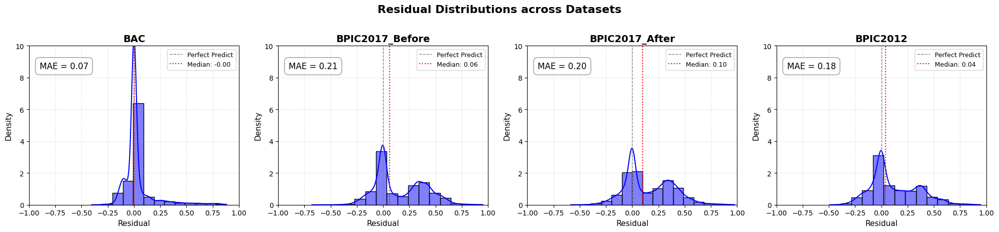

In [32]:
# =====================================================================
# 4. GRAFICO 1: Distribuzione dei Residui (Residual Distributions)
# =====================================================================
regression_results = {k: v for k, v in results.items() if v.get("target") == "sigmoid_mm"}

if regression_results:
    fig1, axes1 = plt.subplots(1, len(regression_results), figsize=(5 * len(regression_results), 4.5), sharey=False)
    if len(regression_results) == 1:
        axes1 = [axes1]
        
    for i, (name, info) in enumerate(regression_results.items()):
        ax = axes1[i]
        residuals = info["residuals"]
        mae = info["mae"]
        
        # Istogramma e curva di densità KDE (binwidth=0.1)
        sns.histplot(
            residuals, 
            kde=True, 
            ax=ax, 
            color="blue", 
            stat="density", 
            alpha=0.5,
            binwidth=0.1
        )
        
        # Riferimenti verticali (Zero e Mediana)
        ax.axvline(0, color="gray", linestyle="--", linewidth=1, label="Perfect Predict")
        median_res = np.median(residuals)
        ax.axvline(median_res, color="red", linestyle=":", linewidth=1.5, label=f"Median: {median_res:.2f}")
        
        # Box con il valore del MAE globale
        ax.text(0.05, 0.90, f"MAE = {mae:.2f}", transform=ax.transAxes, fontsize=12,
                verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8, edgecolor='gray'))
        
        # Layout estetico
        ax.set_title(name, fontsize=14, fontweight="bold")
        ax.set_xlabel("Residual", fontsize=11)
        ax.set_ylabel("Density", fontsize=11)
        ax.set_xlim(-1.0, 1.0)
        ax.set_ylim(0, 10.0)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="upper right", fontsize=9)

    plt.suptitle("Residual Distributions across Datasets", fontsize=16, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.show()

### MAE vs Remaining Time (TRUE)

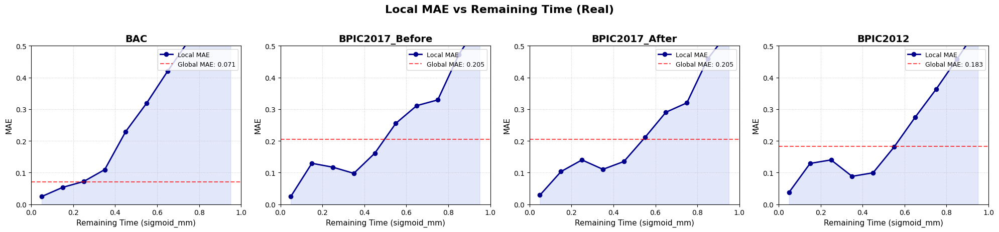

In [33]:
# =====================================================================
# 5. GRAFICO 2: MAE locale vs Remaining Time Reale
# =====================================================================
results_mae_vs_time = {}

for name, info in regression_results.items():
    y_true = info["y_true"]
    y_pred = info["y_pred"]
    
    # DataFrame temporaneo per analizzare l'errore per riga
    df_analysis = pd.DataFrame({
        "remaining_time": y_true,
        "absolute_error": np.abs(y_true - y_pred)
    })
    
    # Suddivisione in 10 bin da 0.0 a 1.0
    bins = np.linspace(0.0, 1.0, 11)
    df_analysis["time_bin"] = pd.cut(df_analysis["remaining_time"], bins=bins, include_lowest=True)
    
    # Calcolo della media locale degli errori assoluti
    bin_mae = df_analysis.groupby("time_bin", observed=False)["absolute_error"].mean().reset_index()
    bin_mae["bin_center"] = bin_mae["time_bin"].apply(lambda interval: interval.mid)
    
    results_mae_vs_time[name] = {
        "df_mae": bin_mae,
        "global_mae": info["mae"]
    }

if results_mae_vs_time:
    fig2, axes2 = plt.subplots(1, len(results_mae_vs_time), figsize=(5 * len(results_mae_vs_time), 4.5), sharey=False)
    if len(results_mae_vs_time) == 1:
        axes2 = [axes2]
        
    for i, (name, data) in enumerate(results_mae_vs_time.items()):
        ax = axes2[i]
        df_mae = data["df_mae"]
        global_mae = data["global_mae"]
        
        # Curva del MAE locale
        ax.plot(
            df_mae["bin_center"], 
            df_mae["absolute_error"], 
            color="darkblue", 
            marker="o", 
            linewidth=2, 
            label="Local MAE"
        )
        
        # Area colorata
        ax.fill_between(
            df_mae["bin_center"].astype(float), 
            df_mae["absolute_error"].astype(float), 
            color="royalblue", 
            alpha=0.15
        )
        
        # Riferimento MAE globale (Tratteggio rosso)
        ax.axhline(
            global_mae, 
            color="red", 
            linestyle="--", 
            alpha=0.7, 
            label=f"Global MAE: {global_mae:.3f}"
        )
        
        # Layout estetico
        ax.set_title(name, fontsize=14, fontweight="bold")
        ax.set_xlabel("Remaining Time (sigmoid_mm)", fontsize=11)
        ax.set_ylabel("MAE", fontsize=11)
        ax.set_xlim(0.0, 1.0)
        ax.set_ylim(0.0, 0.5)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="upper right", fontsize=9)
        
    plt.suptitle("Local MAE vs Remaining Time (Real)", fontsize=16, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("Nessun modello di regressione (sigmoid_mm) trovato nei risultati.")

## Caso singolo dataset


=== Elaborazione BAC (BAC) ===
Trovate 21 lunghezze di traccia distinte. Generazione di una griglia 6x4...


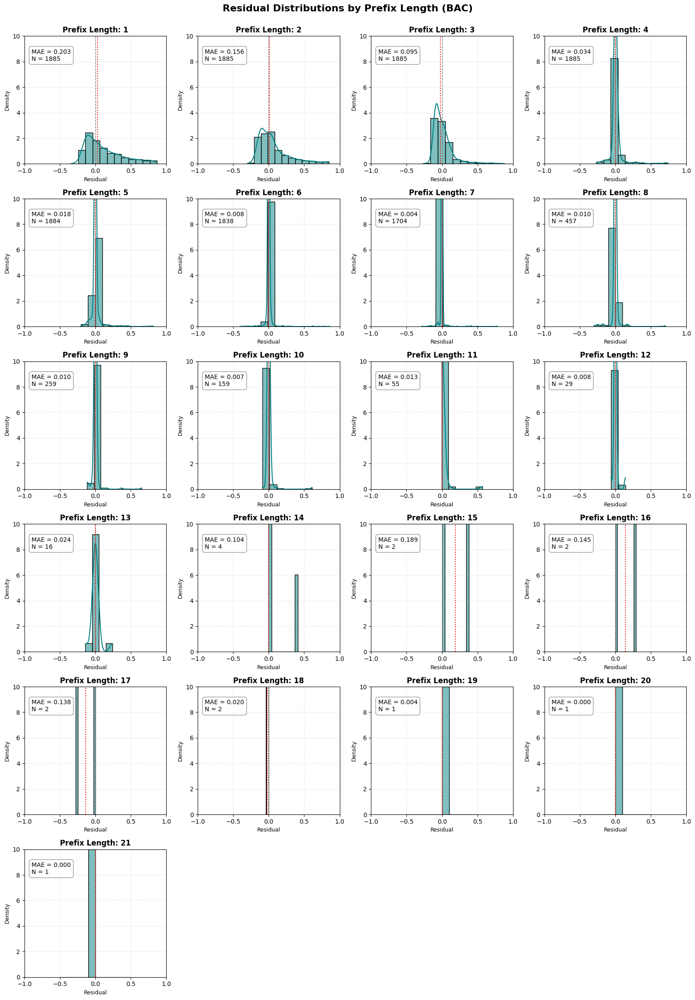

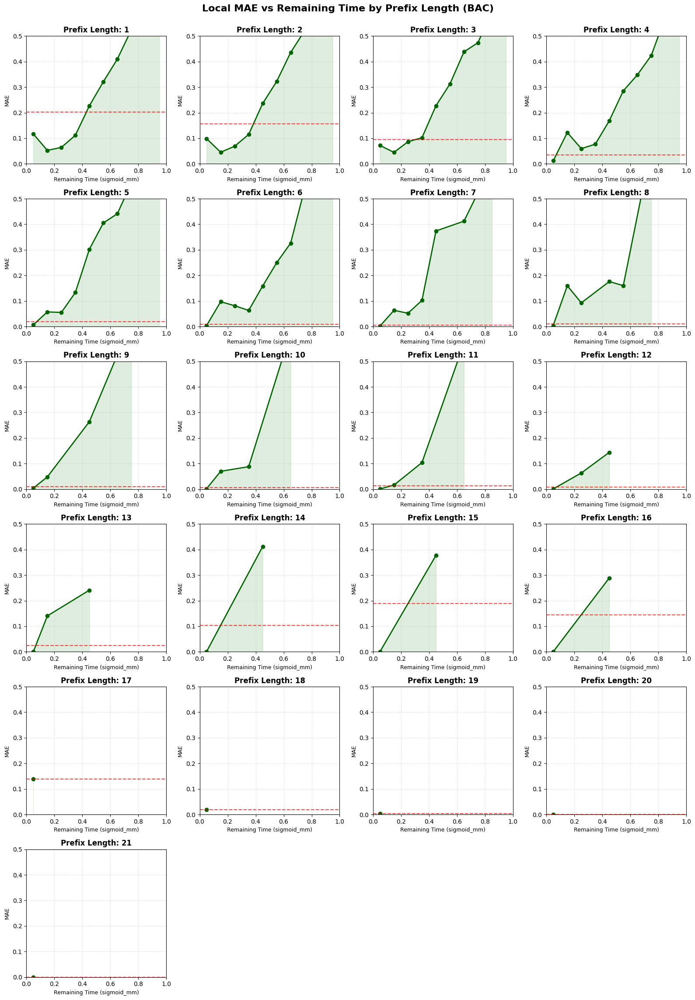


=== Elaborazione BPIC2017_Before (bpi17_before) ===
Trovate 50 lunghezze di traccia distinte. Generazione di una griglia 13x4...


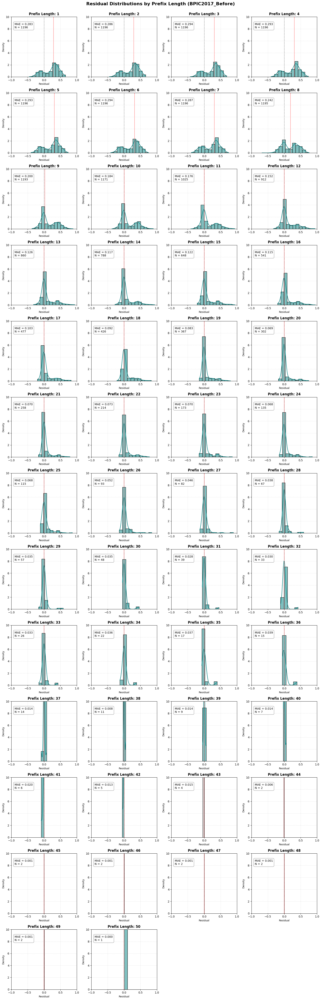

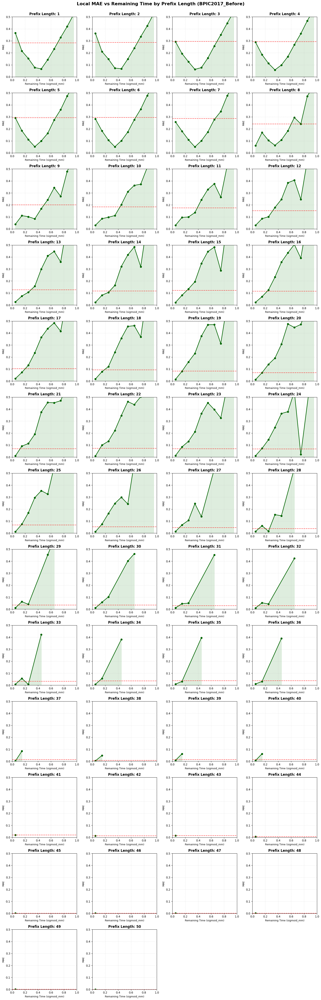


=== Elaborazione BPIC2017_After (bpi17_after) ===
Trovate 53 lunghezze di traccia distinte. Generazione di una griglia 14x4...


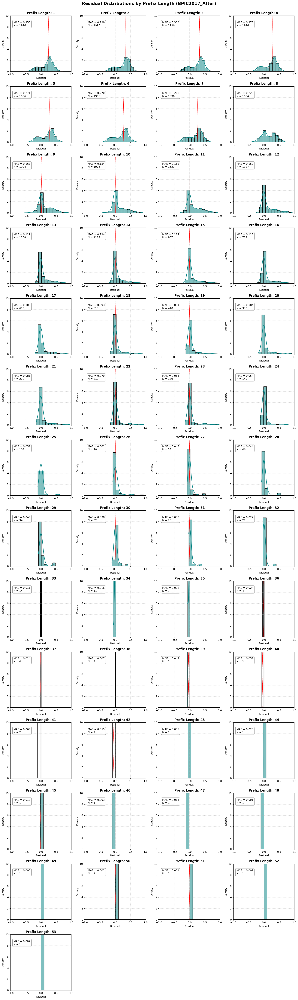

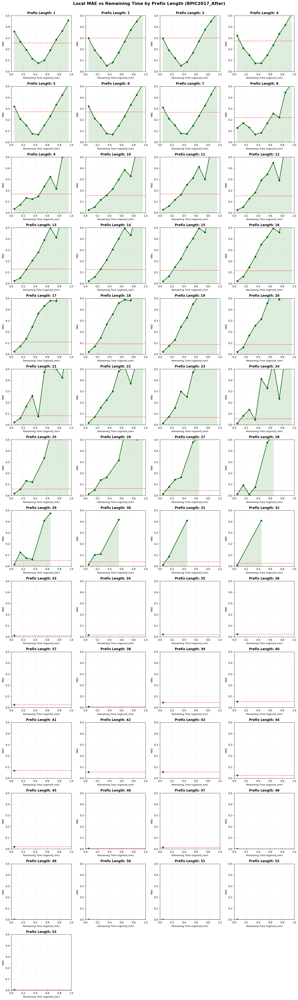


=== Elaborazione BPIC2012 (BPI12) ===
Trovate 88 lunghezze di traccia distinte. Generazione di una griglia 22x4...


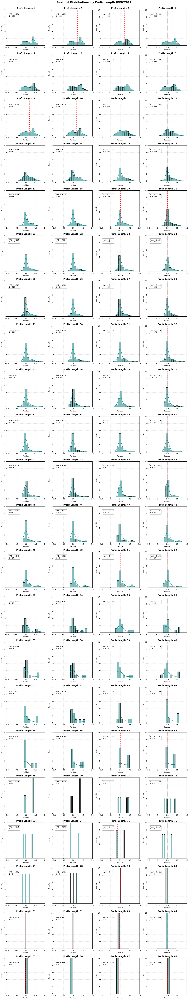

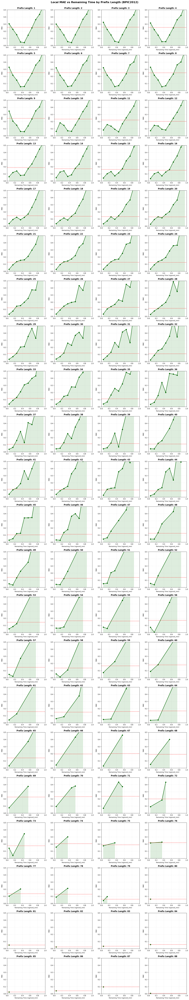

In [ ]:
# =====================================================================
# 4. GRAFICI PER TUTTI I DATASET: Distribuzione dei residui e MAE locale
# =====================================================================

for dataset_key, paths in datasets.items():
    case_study = case_study_map[dataset_key]
    model_path = Path(paths["model_path"])
    test_data_path = Path(paths["test_data_path"])

    if not model_path.exists() or not test_data_path.exists():
        print(f"⚠️ File non trovati per {dataset_key}. Salto temporaneamente questo dataset.")
        continue

    print(f"\n=== Elaborazione {dataset_key} ({case_study}) ===")

    model = joblib.load(model_path)
    case_id_name, _, _, _, categorical_features, columns_to_remove = get_features(case_study)
    test_df = pd.read_csv(test_data_path, parse_dates=[end_date_name, start_date_name])

    # Calcolo della lunghezza della traccia (prefix length)
    test_df = test_df.sort_values(by=[case_id_name, end_date_name]).reset_index(drop=True)
    test_df["prefix_length"] = test_df.groupby(case_id_name).cumcount() + 1

    X_test, _, y_sigmoid = prepare_df_for_ml(
        test_df,
        case_id_name=case_id_name,
        columns_to_remove=columns_to_remove,
    )

    if hasattr(model, "feature_names_in_"):
        expected_cols = list(model.feature_names_in_)
        if list(X_test.columns) != expected_cols:
            X_test = X_test.reindex(columns=expected_cols)

    X_test = coerce_categorical_features_for_model(
        X_test,
        model,
        [col for col in categorical_features if col in X_test.columns],
    )

    y_pred = model.predict(X_test)

    df_analysis = pd.DataFrame({
        "prefix_length": test_df["prefix_length"],
        "y_true": y_sigmoid,
        "y_pred": y_pred,
        "residual": y_sigmoid - y_pred,
        "abs_error": np.abs(y_sigmoid - y_pred),
    })

    all_lengths = sorted(df_analysis["prefix_length"].unique())
    n_plots = len(all_lengths)
    n_cols = 4
    n_rows = int(np.ceil(n_plots / n_cols))

    print(f"Trovate {n_plots} lunghezze di traccia distinte. Generazione di una griglia {n_rows}x{n_cols}...")

    # Grafico 1: distribuzione dei residui per lunghezza di prefix
    fig1, axes1 = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3.8 * n_rows), squeeze=False)

    for idx, length in enumerate(all_lengths):
        row_idx = idx // n_cols
        col_idx = idx % n_cols
        ax = axes1[row_idx, col_idx]

        sub_df = df_analysis[df_analysis["prefix_length"] == length]
        residuals = sub_df["residual"]
        mae = sub_df["abs_error"].mean()

        data_range = residuals.max() - residuals.min() if len(residuals) > 0 else 0

        if len(residuals) < 5 or residuals.nunique() <= 1 or data_range < 0.05:
            sns.histplot(residuals, ax=ax, color="teal", stat="density", alpha=0.5, bins=10, kde=False)
        else:
            sns.histplot(residuals, kde=True, ax=ax, color="teal", stat="density", alpha=0.5, binwidth=0.1)

        ax.axvline(0, color="gray", linestyle="--", linewidth=1, label="Perfect Predict")
        median_res = np.median(residuals) if len(residuals) > 0 else 0
        ax.axvline(median_res, color="red", linestyle=":", linewidth=1.5, label=f"Median: {median_res:.2f}")

        ax.text(
            0.05,
            0.90,
            f"MAE = {mae:.3f}\nN = {len(sub_df)}",
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment="top",
            bbox=dict(boxstyle="round,pad=0.4", facecolor="white", alpha=0.8, edgecolor="gray"),
        )

        ax.set_title(f"Prefix Length: {length}", fontsize=12, fontweight="bold")
        ax.set_xlabel("Residual", fontsize=9)
        ax.set_ylabel("Density", fontsize=9)
        ax.set_xlim(-1.0, 1.0)
        ax.set_ylim(0, 10.0)
        ax.grid(True, linestyle=":", alpha=0.6)

    for idx in range(n_plots, n_rows * n_cols):
        row_idx = idx // n_cols
        col_idx = idx % n_cols
        fig1.delaxes(axes1[row_idx, col_idx])

    plt.suptitle(f"Residual Distributions by Prefix Length ({dataset_key})", fontsize=16, fontweight="bold", y=1.00)
    plt.tight_layout()
    plt.show()

    # Grafico 2: MAE locale vs remaining time per lunghezza di prefix
    fig2, axes2 = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3.8 * n_rows), squeeze=False)
    bins = np.linspace(0.0, 1.0, 11)

    for idx, length in enumerate(all_lengths):
        row_idx = idx // n_cols
        col_idx = idx % n_cols
        ax = axes2[row_idx, col_idx]

        sub_df = df_analysis[df_analysis["prefix_length"] == length].copy()

        if not sub_df.empty:
            sub_df["time_bin"] = pd.cut(sub_df["y_true"], bins=bins, include_lowest=True)
            bin_mae = sub_df.groupby("time_bin", observed=False)["abs_error"].mean().reset_index()
            bin_mae["bin_center"] = bin_mae["time_bin"].apply(lambda interval: interval.mid)
            bin_mae = bin_mae.dropna(subset=["abs_error"])

            global_mae = sub_df["abs_error"].mean()

            if len(bin_mae) > 0:
                ax.plot(bin_mae["bin_center"], bin_mae["abs_error"], color="darkgreen", marker="o", linewidth=2, label="Local MAE")
                ax.fill_between(bin_mae["bin_center"].astype(float), bin_mae["abs_error"].astype(float), color="forestgreen", alpha=0.15)

            ax.axhline(global_mae, color="red", linestyle="--", alpha=0.7, label=f"Prefix MAE: {global_mae:.3f}")
            ax.set_title(f"Prefix Length: {length}", fontsize=12, fontweight="bold")
            ax.set_xlabel("Remaining Time (sigmoid_mm)", fontsize=9)
            ax.set_ylabel("MAE", fontsize=9)
            ax.set_xlim(0.0, 1.0)
            ax.set_ylim(0.0, 0.5)
            ax.grid(True, linestyle=":", alpha=0.6)
        else:
            ax.text(0.5, 0.5, "No Data", horizontalalignment="center", verticalalignment="center")

    for idx in range(n_plots, n_rows * n_cols):
        row_idx = idx // n_cols
        col_idx = idx % n_cols
        fig2.delaxes(axes2[row_idx, col_idx])

    plt.suptitle(f"Local MAE vs Remaining Time by Prefix Length ({dataset_key})", fontsize=16, fontweight="bold", y=1.00)
    plt.tight_layout()
    plt.show()

## Caso con lambda confronto diem

Calcolo MAE combinato completato (Lambda = 0.5). Generazione griglia 13x4...


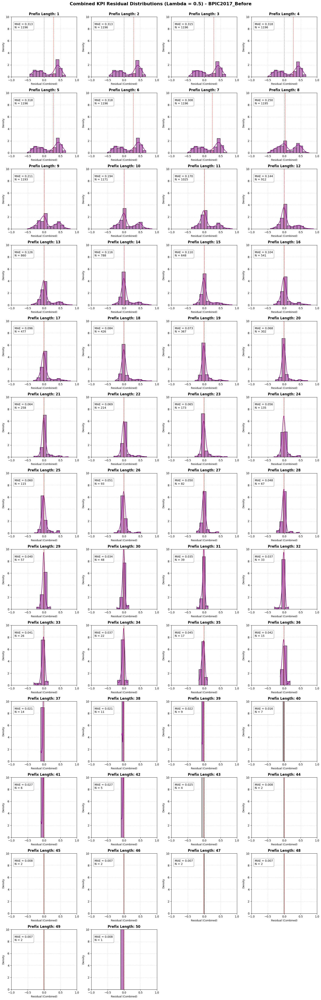

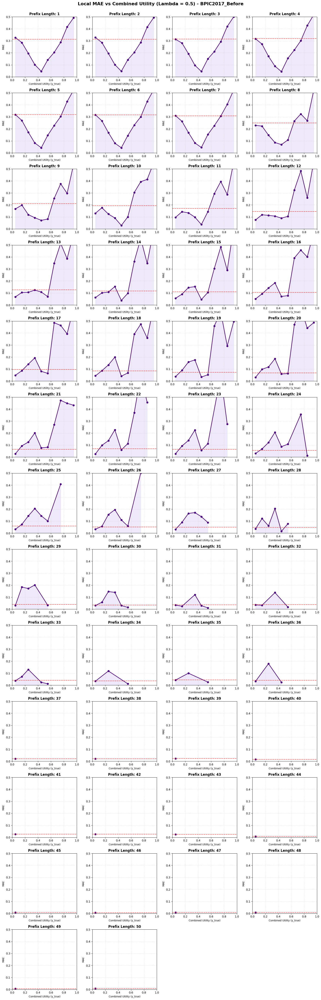

In [42]:
import os
import sys
from pathlib import Path
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error

# =====================================================================
# 1. Configurazione dei percorsi e caricamento del dataset di esempio
# =====================================================================
base_dir = Path.cwd()
if not (base_dir / "case_studies").exists():
    base_dir = Path("C:/Users/Utente/Desktop/tesi magistrale/Code/2-gelmini-multi").resolve()

sys.path.insert(0, str(base_dir))

from utils.get_features import get_features
from utils.predictive_models_functions import prepare_df_for_ml

dataset_key = "BPIC2017_Before"
case_study = "bpi17_before"

# Percorsi per entrambi i modelli (.joblib)
model_sigmoid_path = Path(base_dir / "case_studies" / "bpi17_before" / "model" / "catboost_model_sigmoid_mm.joblib")
model_label_path = Path(base_dir / "case_studies" / "bpi17_before" / "model" / "catboost_model_label.joblib")
test_data_path = Path(base_dir / "case_studies" / "bpi17_before" / "test_data.csv")

end_date_name = "time:timestamp"
start_date_name = "start:timestamp"

if not model_sigmoid_path.exists() or not model_label_path.exists() or not test_data_path.exists():
    raise FileNotFoundError("Verifica la presenza di entrambi i modelli (sigmoid e label) e del test_data.csv.")

# Carichiamo i due modelli e il test dataframe
model_sigmoid = joblib.load(model_sigmoid_path)
model_label = joblib.load(model_label_path)

case_id_name, _, _, _, categorical_features, columns_to_remove = get_features(case_study)
test_df = pd.read_csv(test_data_path, parse_dates=[end_date_name, start_date_name])

# =====================================================================
# 2. Calcolo della Lunghezza della Traccia (Prefix Length)
# =====================================================================
test_df = test_df.sort_values(by=[case_id_name, end_date_name]).reset_index(drop=True)
test_df["prefix_length"] = test_df.groupby(case_id_name).cumcount() + 1

# Estraiamo le feature e i target originali
X_test, y_label, y_sigmoid = prepare_df_for_ml(
    test_df,
    case_id_name=case_id_name,
    outcome_name='outcome',
    columns_to_remove=columns_to_remove,
)

# Funzione per allineare le colonne in base alle aspettative del modello
def align_and_coerce(X, model, cat_cols):
    if hasattr(model, "feature_names_in_"):
        expected_cols = list(model.feature_names_in_)
        if list(X.columns) != expected_cols:
            X = X.reindex(columns=expected_cols)
    return coerce_categorical_features_for_model(X, model, [c for c in cat_cols if c in X.columns])

# Prepariamo X_test separatamente per i due modelli (nel caso avessero feature_names_in_ leggermente diversi)
X_test_sig = align_and_coerce(X_test.copy(), model_sigmoid, categorical_features)
X_test_lab = align_and_coerce(X_test.copy(), model_label, categorical_features)

# =====================================================================
# 3. Predizione combinata (Multi-Objective con Lambda = 0.5)
# =====================================================================
# 1. Predizione Regressore (Remaining Time)
pred_sigmoid = model_sigmoid.predict(X_test_sig)

# 2. Predizione Classificatore (Probabilità della classe positiva, es. O_Accepted)
# predict_proba restituisce [prob_classe_0, prob_classe_1]
if hasattr(model_label, "predict_proba"):
    pred_label_prob = model_label.predict_proba(X_test_lab)[:, 1]
else:
    # Fallback se non è un classificatore probabilistico standard
    pred_label_prob = model_label.predict(X_test_lab)

# Parametro lambda impostato a 0.5
lmbda = 0.5

# Calcolo del target combinato reale e predetto (come da Eq. 5 dell'articolo)
# U = lambda * (1 - CO) + (1 - lambda) * RT
y_true_combined = lmbda * (1.0 - y_label) + (1.0 - lmbda) * y_sigmoid
y_pred_combined = lmbda * (1.0 - pred_label_prob) + (1.0 - lmbda) * pred_sigmoid

# Creazione del DataFrame di analisi complessivo
df_analysis = pd.DataFrame({
    "prefix_length": test_df["prefix_length"],
    "y_true": y_true_combined,
    "y_pred": y_pred_combined,
    "residual": y_true_combined - y_pred_combined,
    "abs_error": np.abs(y_true_combined - y_pred_combined)
})

# =====================================================================
# 4. Configurazione della Griglia dei Grafici
# =====================================================================
all_lengths = sorted(df_analysis["prefix_length"].unique())
n_plots = len(all_lengths)
n_cols = 4
n_rows = int(np.ceil(n_plots / n_cols))

print(f"Calcolo MAE combinato completato (Lambda = {lmbda}). Generazione griglia {n_rows}x{n_cols}...")

# =====================================================================
# 5. GRAFICO 1: Distribuzione dei Residui Combinati per Prefix Length
# =====================================================================
fig1, axes1 = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3.8 * n_rows), squeeze=False)

for idx, length in enumerate(all_lengths):
    row_idx = idx // n_cols
    col_idx = idx % n_cols
    ax = axes1[row_idx, col_idx]
    
    sub_df = df_analysis[df_analysis["prefix_length"] == length]
    residuals = sub_df["residual"]
    mae = sub_df["abs_error"].mean()
    
    data_range = residuals.max() - residuals.min() if len(residuals) > 0 else 0
    
    if len(residuals) < 5 or residuals.nunique() <= 1 or data_range < 0.05:
        sns.histplot(residuals, ax=ax, color="purple", stat="density", alpha=0.5, bins=10, kde=False)
    else:
        sns.histplot(residuals, kde=True, ax=ax, color="purple", stat="density", alpha=0.5, binwidth=0.1)
    
    ax.axvline(0, color="gray", linestyle="--", linewidth=1, label="Perfect Predict")
    median_res = np.median(residuals) if len(residuals) > 0 else 0
    ax.axvline(median_res, color="red", linestyle=":", linewidth=1.5, label=f"Median: {median_res:.2f}")
    
    ax.text(0.05, 0.90, f"MAE = {mae:.3f}\nN = {len(sub_df)}", transform=ax.transAxes, fontsize=10,
            verticalalignment='top', bbox=dict(boxstyle='round,pad=0.4', facecolor='white', alpha=0.8, edgecolor='gray'))
    
    ax.set_title(f"Prefix Length: {length}", fontsize=12, fontweight="bold")
    ax.set_xlabel("Residual (Combined)", fontsize=9)
    ax.set_ylabel("Density", fontsize=9)
    ax.set_xlim(-1.0, 1.0)
    ax.set_ylim(0, 10.0)
    ax.grid(True, linestyle=":", alpha=0.6)

for idx in range(n_plots, n_rows * n_cols):
    row_idx = idx // n_cols
    col_idx = idx % n_cols
    fig1.delaxes(axes1[row_idx, col_idx])

plt.suptitle(f"Combined KPI Residual Distributions (Lambda = {lmbda}) - {dataset_key}", fontsize=16, fontweight="bold", y=1.00)
plt.tight_layout()
plt.show()

# =====================================================================
# 6. GRAFICO 2: MAE locale vs Utility combinata (y_true) reale
# =====================================================================
fig2, axes2 = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3.8 * n_rows), squeeze=False)
bins = np.linspace(0.0, 1.0, 11)

for idx, length in enumerate(all_lengths):
    row_idx = idx // n_cols
    col_idx = idx % n_cols
    ax = axes2[row_idx, col_idx]
    
    sub_df = df_analysis[df_analysis["prefix_length"] == length].copy()
    
    if not sub_df.empty:
        sub_df["time_bin"] = pd.cut(sub_df["y_true"], bins=bins, include_lowest=True)
        bin_mae = sub_df.groupby("time_bin", observed=False)["abs_error"].mean().reset_index()
        bin_mae["bin_center"] = bin_mae["time_bin"].apply(lambda interval: interval.mid)
        bin_mae = bin_mae.dropna(subset=["abs_error"])
        
        global_mae = sub_df["abs_error"].mean()
        
        if len(bin_mae) > 0:
            ax.plot(bin_mae["bin_center"], bin_mae["abs_error"], color="indigo", marker="o", linewidth=2, label="Local MAE")
            ax.fill_between(bin_mae["bin_center"].astype(float), bin_mae["abs_error"].astype(float), color="mediumpurple", alpha=0.15)
        
        ax.axhline(global_mae, color="red", linestyle="--", alpha=0.7, label=f"Prefix MAE: {global_mae:.3f}")
        
        ax.set_title(f"Prefix Length: {length}", fontsize=12, fontweight="bold")
        ax.set_xlabel("Combined Utility (y_true)", fontsize=9)
        ax.set_ylabel("MAE", fontsize=9)
        ax.set_xlim(0.0, 1.0)
        ax.set_ylim(0.0, 0.5)
        ax.grid(True, linestyle=":", alpha=0.6)
    else:
        ax.text(0.5, 0.5, "No Data", horizontalalignment='center', verticalalignment='center')

for idx in range(n_plots, n_rows * n_cols):
    row_idx = idx // n_cols
    col_idx = idx % n_cols
    fig2.delaxes(axes2[row_idx, col_idx])

plt.suptitle(f"Local MAE vs Combined Utility (Lambda = {lmbda}) - {dataset_key}", fontsize=16, fontweight="bold", y=1.00)
plt.tight_layout()
plt.show()

✅ Calcolato combinato per BAC: MAE = 0.0981
✅ Calcolato combinato per BPIC2017_Before: MAE = 0.2156
✅ Calcolato combinato per BPIC2017_After: MAE = 0.2109
✅ Calcolato combinato per BPIC2012: MAE = 0.2217


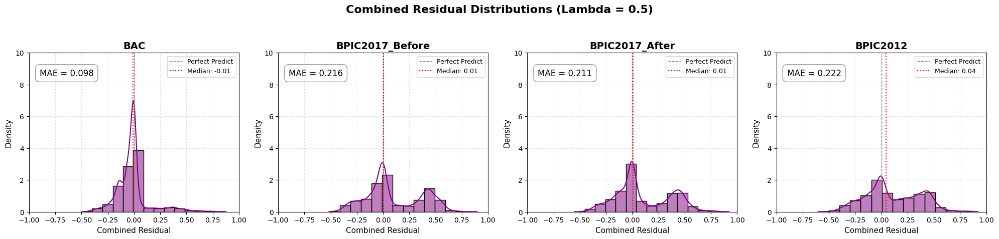

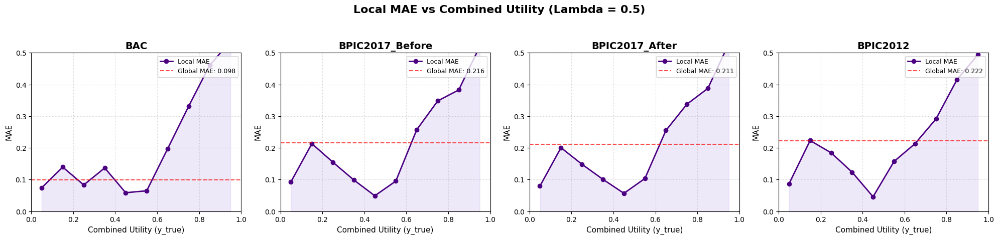

In [ ]:
import os
import sys
from pathlib import Path
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error

# =====================================================================
# 1. Configurazione dei percorsi e dei dataset
# =====================================================================
base_dir = Path.cwd()
if not (base_dir / "case_studies").exists():
    base_dir = Path("C:/Users/Utente/Desktop/tesi magistrale/Code/2-gelmini-multi").resolve()

# Inseriamo la cartella di progetto in sys.path per importare i moduli utils
sys.path.insert(0, str(base_dir))

from utils.get_features import get_features
from utils.predictive_models_functions import prepare_df_for_ml

def build_path(dataset_name: str, file_name: str, subfolder: str = "") -> str:
    base_path = base_dir / "case_studies" / dataset_name
    if subfolder:
        base_path = base_path / subfolder
    return str(base_path / file_name)

# Configurazione per caricare ENTRAMBI i modelli (sigmoid e label) per ciascun dataset
datasets = {
    "BAC": {
        "model_sig_path": build_path("BAC", "catboost_model_sigmoid_mm.joblib", "model"),
        "model_lab_path": build_path("BAC", "catboost_model_label.joblib", "model"),
        "test_data_path": build_path("BAC", "test_data.csv")
    },
    "BPIC2017_Before": {
        "model_sig_path": build_path("bpi17_before", "catboost_model_sigmoid_mm.joblib", "model"),
        "model_lab_path": build_path("bpi17_before", "catboost_model_label.joblib", "model"),
        "test_data_path": build_path("bpi17_before", "test_data.csv")
    },
    "BPIC2017_After": {
        "model_sig_path": build_path("bpi17_after", "catboost_model_sigmoid_mm.joblib", "model"),
        "model_lab_path": build_path("bpi17_after", "catboost_model_label.joblib", "model"),
        "test_data_path": build_path("bpi17_after", "test_data.csv")
    },
    "BPIC2012": {
        "model_sig_path": build_path("BPI12", "catboost_model_sigmoid_mm.joblib", "model"),
        "model_lab_path": build_path("BPI12", "catboost_model_label.joblib", "model"),
        "test_data_path": build_path("BPI12", "test_data.csv")
    },
}

case_study_map = {
    "BAC": "BAC",
    "BPIC2017_Before": "bpi17_before",
    "BPIC2017_After": "bpi17_after",
    "BPIC2012": "BPI12",
}

end_date_name = "time:timestamp"
start_date_name = "start:timestamp"


# =====================================================================
# 2. Funzione di Supporto per il Preprocessing
# =====================================================================
def coerce_categorical_features_for_model(X: pd.DataFrame, model, categorical_columns):
    try:
        transformation_step = model.named_steps["transformation"]
    except Exception:
        return X

    if not hasattr(transformation_step, "named_transformers_"):
        return X

    cat_transformer = transformation_step.named_transformers_.get("cat")
    if cat_transformer is None:
        return X

    onehot = None
    if hasattr(cat_transformer, "named_steps"):
        onehot = cat_transformer.named_steps.get("onehot")
    if onehot is None or not hasattr(onehot, "categories_"):
        return X

    for idx, col_name in enumerate(categorical_columns):
        if col_name not in X.columns:
            continue

        known_categories = onehot.categories_[idx] if idx < len(onehot.categories_) else None
        if known_categories is None or len(known_categories) == 0:
            continue

        sample = X[col_name]
        first_category = next((value for value in known_categories if pd.notna(value)), None)
        if first_category is None:
            continue

        try:
            if isinstance(first_category, (str, np.str_)):
                X[col_name] = sample.fillna("").astype(str)
            elif isinstance(first_category, (int, np.integer)):
                X[col_name] = pd.to_numeric(sample, errors="coerce").astype("Int64")
            elif isinstance(first_category, (float, np.floating, bool, np.bool_)):
                X[col_name] = pd.to_numeric(sample, errors="coerce")
            else:
                X[col_name] = sample.fillna("").astype(str)
        except Exception:
            X[col_name] = sample.fillna("").astype(str)

    return X


def align_and_coerce(X, model, cat_cols):
    if hasattr(model, "feature_names_in_"):
        expected_cols = list(model.feature_names_in_)
        if list(X.columns) != expected_cols:
            X = X.reindex(columns=expected_cols)
    return coerce_categorical_features_for_model(X, model, [c for c in cat_cols if c in X.columns])


# =====================================================================
# 3. Calcolo delle Predizioni Combinate (Lambda = 0.5)
# =====================================================================
results_combined = {}
lmbda = 0.5  # Peso combinato per la tesi

for name, paths in datasets.items():
    case_study = case_study_map[name]
    model_sig_path = Path(paths["model_sig_path"])
    model_lab_path = Path(paths["model_lab_path"])
    test_data_path = Path(paths["test_data_path"])

    if not model_sig_path.exists() or not model_lab_path.exists() or not test_data_path.exists():
        print(f"⚠️ File mancanti per {name}. Salto il dataset.")
        continue

    # Caricamento dei due modelli salvati
    model_sig = joblib.load(model_sig_path)
    model_lab = joblib.load(model_lab_path)

    case_id_name, _, _, _, categorical_features, columns_to_remove = get_features(case_study)
    test_df = pd.read_csv(test_data_path, parse_dates=[end_date_name, start_date_name])

    # Estrazione feature e target nativi
    X_test, y_label, y_sigmoid = prepare_df_for_ml(
        test_df,
        case_id_name=case_id_name,
        columns_to_remove=columns_to_remove,
    )

    # Allineamento feature per ciascun modello
    X_test_sig = align_and_coerce(X_test.copy(), model_sig, categorical_features)
    X_test_lab = align_and_coerce(X_test.copy(), model_lab, categorical_features)

    # 1. Predizione Regressore (Tempo rimanente normalizzato)
    pred_sig = model_sig.predict(X_test_sig)

    # 2. Predizione Classificatore (Probabilità della classe positiva)
    if hasattr(model_lab, "predict_proba"):
        pred_lab_prob = model_lab.predict_proba(X_test_lab)[:, 1]
    else:
        pred_lab_prob = model_lab.predict(X_test_lab)

    # Calcolo target reale combinato e predizione combinata (Multi-Objective)
    # U = lambda * (1 - CO) + (1 - lambda) * RT
    y_true_comb = lmbda * (1.0 - y_label) + (1.0 - lmbda) * y_sigmoid
    y_pred_comb = lmbda * (1.0 - pred_lab_prob) + (1.0 - lmbda) * pred_sig

    residuals_comb = y_true_comb - y_pred_comb
    mae_comb = mean_absolute_error(y_true_comb, y_pred_comb)

    results_combined[name] = {
        "y_true": y_true_comb,
        "y_pred": y_pred_comb,
        "residuals": residuals_comb,
        "mae": mae_comb
    }
    print(f"✅ Calcolato combinato per {name}: MAE = {mae_comb:.4f}")


# =====================================================================
# 4. GRAFICO 1: Distribuzione dei Residui Combinati per Dataset
# =====================================================================
if results_combined:
    fig1, axes1 = plt.subplots(1, len(results_combined), figsize=(5 * len(results_combined), 4.5), sharey=False)
    if len(results_combined) == 1:
        axes1 = [axes1]

    for i, (name, info) in enumerate(results_combined.items()):
        ax = axes1[i]
        residuals = info["residuals"]
        mae = info["mae"]

        # Istogramma residui combinati con binwidth=0.1
        sns.histplot(
            residuals,
            kde=True,
            ax=ax,
            color="purple",
            stat="density",
            alpha=0.5,
            binwidth=0.1
        )

        # Linee di riferimento (Zero e Mediana)
        ax.axvline(0, color="gray", linestyle="--", linewidth=1, label="Perfect Predict")
        median_res = np.median(residuals)
        ax.axvline(median_res, color="red", linestyle=":", linewidth=1.5, label=f"Median: {median_res:.2f}")

        # Box con il valore del MAE combinato globale del dataset
        ax.text(0.05, 0.90, f"MAE = {mae:.3f}", transform=ax.transAxes, fontsize=12,
                verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8, edgecolor='gray'))

        ax.set_title(name, fontsize=14, fontweight="bold")
        ax.set_xlabel("Combined Residual", fontsize=11)
        ax.set_ylabel("Density", fontsize=11)
        ax.set_xlim(-1.0, 1.0)
        ax.set_ylim(0, 10.0)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="upper right", fontsize=9)

    plt.suptitle(f"Combined Residual Distributions (Lambda = {lmbda})", fontsize=16, fontweight="bold", y=1.05)
    plt.tight_layout()
    plt.show()


# =====================================================================
# 5. GRAFICO 2: MAE locale vs Combined Utility (y_true) per Dataset
# =====================================================================
if results_combined:
    fig2, axes2 = plt.subplots(1, len(results_combined), figsize=(5 * len(results_combined), 4.5), sharey=False)
    if len(results_combined) == 1:
        axes2 = [axes2]

    bins = np.linspace(0.0, 1.0, 11)

    for i, (name, info) in enumerate(results_combined.items()):
        ax = axes2[i]
        y_true = info["y_true"]
        y_pred = info["y_pred"]
        global_mae = info["mae"]

        # DataFrame temporaneo per calcolare l'errore per riga
        df_analysis = pd.DataFrame({
            "y_true": y_true,
            "abs_error": np.abs(y_true - y_pred)
        })

        # Binning sulla coordinata X della Combined Utility reale
        df_analysis["bin"] = pd.cut(df_analysis["y_true"], bins=bins, include_lowest=True)
        bin_mae = df_analysis.groupby("bin", observed=False)["abs_error"].mean().reset_index()
        bin_mae["bin_center"] = bin_mae["bin"].apply(lambda interval: interval.mid)
        bin_mae = bin_mae.dropna(subset=["abs_error"])

        # Grafico della curva del MAE locale combinato
        ax.plot(
            bin_mae["bin_center"],
            bin_mae["abs_error"],
            color="indigo",
            marker="o",
            linewidth=2,
            label="Local MAE"
        )

        # Area ombreggiata
        ax.fill_between(
            bin_mae["bin_center"].astype(float),
            bin_mae["abs_error"].astype(float),
            color="mediumpurple",
            alpha=0.15
        )

        # Linea del MAE globale di riferimento per il dataset
        ax.axhline(
            global_mae,
            color="red",
            linestyle="--",
            alpha=0.7,
            label=f"Global MAE: {global_mae:.3f}"
        )

        ax.set_title(name, fontsize=14, fontweight="bold")
        ax.set_xlabel("Combined Utility (y_true)", fontsize=11)
        ax.set_ylabel("MAE", fontsize=11)
        ax.set_xlim(0.0, 1.0)
        ax.set_ylim(0.0, 0.5)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="upper right", fontsize=9)

    plt.suptitle(f"Local MAE vs Combined Utility (Lambda = {lmbda})", fontsize=16, fontweight="bold", y=1.05)
    plt.tight_layout()
    plt.show()

valori di diem:
BAC: MAE = 0.10 
BPIC2017_Before: MAE = 0.26 
BPIC2017_After: MAE = 0.26 
BPIC2012: MAE = 0.25

## prova tempo non normalizzato

c:\Users\Utente\.conda\envs\fbk_thesis_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\Utente\.conda\envs\fbk_thesis_env\Lib\site-packages\optuna\integration\catboost.py:14: FutureWarning: `optuna.integration.catboost` has been deprecated in v4.9.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v4.9.0. Use `optuna_integration.catboost` instead.
  optuna_warn(f"{msg} Use `optuna_integration.catboost` instead.", FutureWarning)


✅ Calcolato tempo per BAC: MAE = 6710.30 Minuti
✅ Calcolato tempo per BPIC2017_Before: MAE = 14686.82 Minuti
✅ Calcolato tempo per BPIC2017_After: MAE = 14252.84 Minuti
✅ Calcolato tempo per BPIC2012: MAE = 11874.48 Minuti


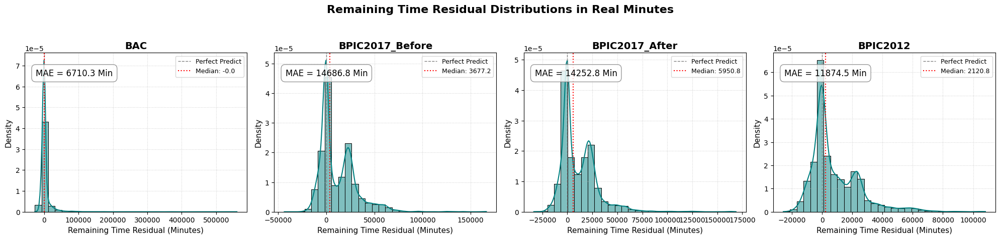

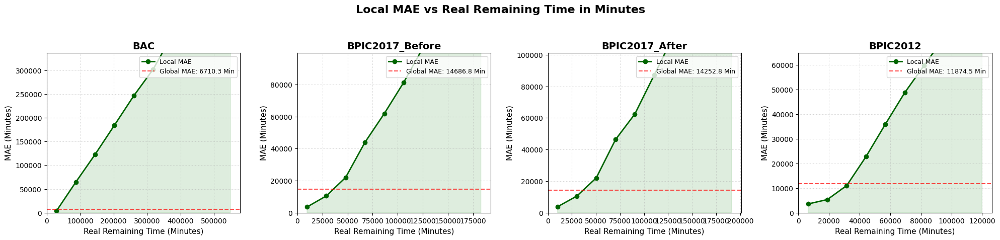

In [1]:
import os
import sys
from pathlib import Path
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error

# =====================================================================
# 1. Configurazione dei percorsi e dei dataset
# =====================================================================
base_dir = Path.cwd()
if not (base_dir / "case_studies").exists():
    base_dir = Path("C:/Users/Utente/Desktop/tesi magistrale/Code/2-gelmini-multi").resolve()

sys.path.insert(0, str(base_dir))

from utils.get_features import get_features 
from utils.predictive_models_functions import prepare_df_for_ml 

def build_path(dataset_name: str, file_name: str, subfolder: str = "") -> str:
    base_path = base_dir / "case_studies" / dataset_name
    if subfolder:
        base_path = base_path / subfolder
    return str(base_path / file_name)

datasets = {
    "BAC": {
        "model_sig_path": build_path("BAC", "catboost_model_sigmoid_mm.joblib", "model"),
        "test_data_path": build_path("BAC", "test_data.csv"),
        "train_data_path": build_path("BAC", "train_data.csv")
    },
    "BPIC2017_Before": {
        "model_sig_path": build_path("bpi17_before", "catboost_model_sigmoid_mm.joblib", "model"),
        "test_data_path": build_path("bpi17_before", "test_data.csv"),
        "train_data_path": build_path("bpi17_before", "train_data.csv")
    },
    "BPIC2017_After": {
        "model_sig_path": build_path("bpi17_after", "catboost_model_sigmoid_mm.joblib", "model"),
        "test_data_path": build_path("bpi17_after", "test_data.csv"),
        "train_data_path": build_path("bpi17_after", "train_data.csv")
    },
    "BPIC2012": {
        "model_sig_path": build_path("BPI12", "catboost_model_sigmoid_mm.joblib", "model"),
        "test_data_path": build_path("BPI12", "test_data.csv"),
        "train_data_path": build_path("BPI12", "train_data.csv")
    },
}

case_study_map = {
    "BAC": "BAC",
    "BPIC2017_Before": "bpi17_before",
    "BPIC2017_After": "bpi17_after",
    "BPIC2012": "BPI12",
}

end_date_name = "time:timestamp"
start_date_name = "start:timestamp"


# =====================================================================
# 2. Funzioni di Supporto per il Preprocessing e Inversione
# =====================================================================
def coerce_categorical_features_for_model(X: pd.DataFrame, model, categorical_columns):
    try:
        transformation_step = model.named_steps["transformation"]
    except Exception:
        return X

    if not hasattr(transformation_step, "named_transformers_"):
        return X

    cat_transformer = transformation_step.named_transformers_.get("cat")
    if cat_transformer is None:
        return X

    onehot = None
    if hasattr(cat_transformer, "named_steps"):
        onehot = cat_transformer.named_steps.get("onehot")
    if onehot is None or not hasattr(onehot, "categories_"):
        return X

    for idx, col_name in enumerate(categorical_columns):
        if col_name not in X.columns:
            continue

        known_categories = onehot.categories_[idx] if idx < len(onehot.categories_) else None
        if known_categories is None or len(known_categories) == 0:
            continue

        sample = X[col_name]
        first_category = next((value for value in known_categories if pd.notna(value)), None)
        if first_category is None:
            continue

        try:
            if isinstance(first_category, (str, np.str_)):
                X[col_name] = sample.fillna("").astype(str)
            elif isinstance(first_category, (int, np.integer)):
                X[col_name] = pd.to_numeric(sample, errors="coerce").astype("Int64")
            elif isinstance(first_category, (float, np.floating, bool, np.bool_)):
                X[col_name] = pd.to_numeric(sample, errors="coerce")
            else:
                X[col_name] = sample.fillna("").astype(str)
        except Exception:
            X[col_name] = sample.fillna("").astype(str)

    return X


def align_and_coerce(X, model, cat_cols):
    if hasattr(model, "feature_names_in_"):
        expected_cols = list(model.feature_names_in_)
        if list(X.columns) != expected_cols:
            X = X.reindex(columns=expected_cols)
    return coerce_categorical_features_for_model(X, model, [c for c in cat_cols if c in X.columns])


def fit_original_scalers(train_data):
    train_copy = train_data.copy()
    
    # 1. StandardScaler fittato sui secondi reali
    scaler = StandardScaler()
    train_copy['standardscaller'] = scaler.fit_transform(train_copy[['remaining_time']])
    
    # 2. Sigmoide nativa
    def sigmoid(x):
        return 1 / (1 + np.exp(-x))
    train_copy['sigmoid'] = sigmoid(train_copy['standardscaller'])
    
    # 3. MinMaxScaler fittato sulla sigmoide
    mm_scaler = MinMaxScaler()
    train_copy['sigmoid_mm'] = mm_scaler.fit_transform(train_copy[['sigmoid']])
    
    return scaler, mm_scaler


def inverse_normalize_remaining_time(normalized_values, scaler, mm_scaler):
    val_arr = np.array(normalized_values).reshape(-1, 1)
    val_arr = np.clip(val_arr, 1e-7, 1 - 1e-7)
    
    # 1. Inversa del MinMaxScaler
    sig_val = mm_scaler.inverse_transform(val_arr)
    sig_val = np.clip(sig_val, 1e-7, 1 - 1e-7)
    
    # 2. Logit (Inversa della Sigmoide)
    standard_val = np.log(sig_val / (1.0 - sig_val))
    
    # 3. Inversa dello StandardScaler
    original_remaining_seconds = scaler.inverse_transform(standard_val)
    
    # Conversione da Secondi a MINUTI (1 minuto = 60 secondi)
    original_remaining_minutes = original_remaining_seconds.flatten() / 60.0
    
    return original_remaining_minutes


# =====================================================================
# 3. Ciclo di Calcolo per Tutti i Dataset (Solo Tempo Rimanente)
# =====================================================================
results_time = {}

for name, paths in datasets.items():
    case_study = case_study_map[name]
    model_sig_path = Path(paths["model_sig_path"])
    test_data_path = Path(paths["test_data_path"])
    train_data_path = Path(paths["train_data_path"])

    if not all([model_sig_path.exists(), test_data_path.exists(), train_data_path.exists()]):
        print(f"⚠️ File mancanti per {name}. Salto questo dataset.")
        continue

    # Caricamento del modello e dei dati
    model_sig = joblib.load(model_sig_path)
    train_df = pd.read_csv(train_data_path)
    test_df = pd.read_csv(test_data_path, parse_dates=[end_date_name, start_date_name])

    # Ricostruzione scaler fittati sul train originale
    scaler, mm_scaler = fit_original_scalers(train_df)

    # Estrazione feature e target nativi
    case_id_name, _, _, _, categorical_features, columns_to_remove = get_features(case_study) 
    X_test, _, _ = prepare_df_for_ml( 
        test_df,
        case_id_name=case_id_name,
        columns_to_remove=columns_to_remove,
    )

    # Allineamento e coercizione delle feature
    X_test_sig = align_and_coerce(X_test.copy(), model_sig, categorical_features)

    # Predizione Regressore (Valore normalizzato tra 0 e 1)
    pred_sig_norm = model_sig.predict(X_test_sig)

    # --- MODIFICA STRATEGICA QUI ---
    # Prendiamo il valore reale in MINUTI direttamente dai secondi nativi del CSV del test set
    y_true_minutes = test_df['remaining_time'].values / 60.0
    
    # De-normalizziamo solo la predizione del modello usando gli scaler fittati sul train
    y_pred_minutes = inverse_normalize_remaining_time(pred_sig_norm, scaler, mm_scaler)
    # -------------------------------

    residuals_min = y_true_minutes - y_pred_minutes
    mae_min = mean_absolute_error(y_true_minutes, y_pred_minutes)

    results_time[name] = {
        "y_true": y_true_minutes,
        "y_pred": y_pred_minutes,
        "residuals": residuals_min,
        "mae": mae_min
    }
    print(f"✅ Calcolato tempo per {name}: MAE = {mae_min:.2f} Minuti")


# =====================================================================
# 4. GRAFICO 1: Distribuzione dei Residui del Tempo Rimanente (Minuti)
# =====================================================================
if results_time:
    fig1, axes1 = plt.subplots(1, len(results_time), figsize=(5 * len(results_time), 4.5), sharey=False)
    if len(results_time) == 1:
        axes1 = [axes1]

    for i, (name, info) in enumerate(results_time.items()):
        ax = axes1[i]
        residuals = info["residuals"]
        mae = info["mae"]

        # Istogramma con densità e curve KDE
        sns.histplot(
            residuals,
            kde=True,
            ax=ax,
            color="teal",
            stat="density",
            alpha=0.5,
            bins=30
        )

        # Riferimenti verticali
        ax.axvline(0, color="gray", linestyle="--", linewidth=1, label="Perfect Predict")
        median_res = np.median(residuals)
        ax.axvline(median_res, color="red", linestyle=":", linewidth=1.5, label=f"Median: {median_res:.1f}")

        # Box MAE
        ax.text(0.05, 0.90, f"MAE = {mae:.1f} Min", transform=ax.transAxes, fontsize=12,
                verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8, edgecolor='gray'))

        ax.set_title(name, fontsize=14, fontweight="bold")
        ax.set_xlabel("Remaining Time Residual (Minutes)", fontsize=11)
        ax.set_ylabel("Density", fontsize=11)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="upper right", fontsize=9)

    plt.suptitle("Remaining Time Residual Distributions in Real Minutes", fontsize=16, fontweight="bold", y=1.05)
    plt.tight_layout()
    plt.show()


# =====================================================================
# 5. GRAFICO 2: MAE locale vs Remaining Time Reale (Minuti)
# =====================================================================
if results_time:
    fig2, axes2 = plt.subplots(1, len(results_time), figsize=(5 * len(results_time), 4.5), sharey=False)
    if len(results_time) == 1:
        axes2 = [axes2]

    for i, (name, info) in enumerate(results_time.items()):
        ax = axes2[i]
        y_true = info["y_true"]
        y_pred = info["y_pred"]
        global_mae = info["mae"]
        max_val = y_true.max()

        df_analysis = pd.DataFrame({
            "y_true": y_true,
            "abs_error": np.abs(y_true - y_pred)
        })

        # Binning sul tempo rimanente reale in minuti
        bins = np.linspace(0.0, max_val, 11)
        df_analysis["bin"] = pd.cut(df_analysis["y_true"], bins=bins, include_lowest=True)
        bin_mae = df_analysis.groupby("bin", observed=False)["abs_error"].mean().reset_index()
        bin_mae["bin_center"] = bin_mae["bin"].apply(lambda interval: interval.mid)
        bin_mae = bin_mae.dropna(subset=["abs_error"])

        # Curva locale
        ax.plot(
            bin_mae["bin_center"],
            bin_mae["abs_error"],
            color="darkgreen",
            marker="o",
            linewidth=2,
            label="Local MAE"
        )
        ax.fill_between(
            bin_mae["bin_center"].astype(float),
            bin_mae["abs_error"].astype(float),
            color="forestgreen",
            alpha=0.15
        )

        # Linea orizzontale MAE globale
        ax.axhline(
            global_mae,
            color="red",
            linestyle="--",
            alpha=0.7,
            label=f"Global MAE: {global_mae:.1f} Min"
        )

        ax.set_title(name, fontsize=14, fontweight="bold")
        ax.set_xlabel("Real Remaining Time (Minutes)", fontsize=11)
        ax.set_ylabel("MAE (Minutes)", fontsize=11)
        ax.set_xlim(0.0, max_val)
        ax.set_ylim(0.0, df_analysis["abs_error"].max() * 0.6)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="upper right", fontsize=9)

    plt.suptitle("Local MAE vs Real Remaining Time in Minutes", fontsize=16, fontweight="bold", y=1.05)
    plt.tight_layout()
    plt.show()